In [1]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import os

/Users/dilara/.julia/conda/3/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [85]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

In [578]:
# Load dataset
df = pd.read_csv(".../processed_model01.csv", delimiter=";")

In [580]:
# Define numerical and categorical columns
numerical_cols = ['duration', 'credit_amount', 'installment_rate', 'residence_duration', 'age', 'number_of_credits', 'people_liable']
categorical_cols = ['status', 'credit_history', 'purpose', 'savings/bonds', 'employment_duration', 'personal_status_and_sex',
                    'other_debtors', 'property', 'installment_plans', 'housing', 'job', 'telephone', 'foreign_worker']

In [582]:
# Apply one-hot encoding to categorical columns
df_encoded = pd.get_dummies(df, columns=categorical_cols)

In [584]:
# Rearrange columns: Numerical first, then categorical, then labels
final_columns = numerical_cols + [col for col in df_encoded.columns if col not in numerical_cols + ['credit_risk', 'predicted_label']] + ['credit_risk', 'predicted_label']
df_encoded = df_encoded[final_columns]

In [586]:
df_encoded = df_encoded.dropna()

In [588]:
X = df_encoded.drop(columns=['credit_risk','id', 'predicted_label'])  # Features
y_pred = df_encoded['predicted_label']  # Model's given predictions

In [590]:
#Pick random instances
def pick_random_instances(X, n=5, seed=42):
    return X.sample(n=n, random_state=seed).index.tolist()

#Pick outlier instances (using z-scores)
def pick_outlier_instances(X, n=5):
    z_scores = np.abs((X - X.mean()) / X.std())
    outlier_scores = z_scores.sum(axis=1)
    return outlier_scores.nlargest(n).index.tolist()

random_indices = pick_random_instances(X)
outlier_indices = pick_outlier_instances(X)

print("Random instances:", random_indices)
print("Outlier instances:", outlier_indices)


# Convert y_pred to probability estimates
y_proba = np.zeros((len(y_pred), 2))  # Create a 2D array for probabilities
y_proba[:, 1] = y_pred  # Assign y_pred as probability for class 1
y_proba[:, 0] = 1 - y_pred  # Compute probability for class 0

def predict_proba_fn(X_input):
    """
    For each row in X_input, find the matching row in X_array by exact comparison,
    and return its pre-stored probability from y_proba.
    If we can't find a match, fallback to [0.5, 0.5].
    """
    outputs = []
    for row in X_input:
        matches = np.where((X_array == row).all(axis=1))[0]
        if len(matches) == 0:
            outputs.append([0.5, 0.5])      # fallback if not found
        else:
            i = matches[0]
            outputs.append(y_proba[i])      # [p0, p1] for that row
    return np.array(outputs)


Random instances: [203, 266, 152, 9, 233]
Outlier instances: [276, 221, 227, 248, 269]


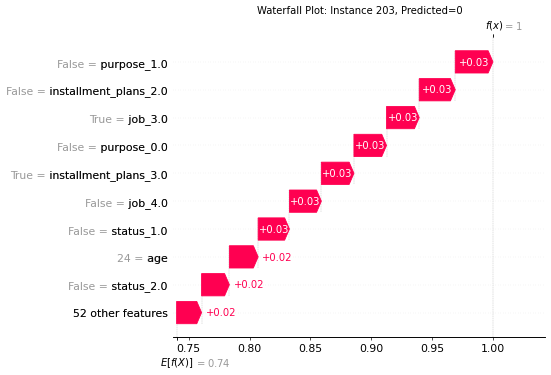

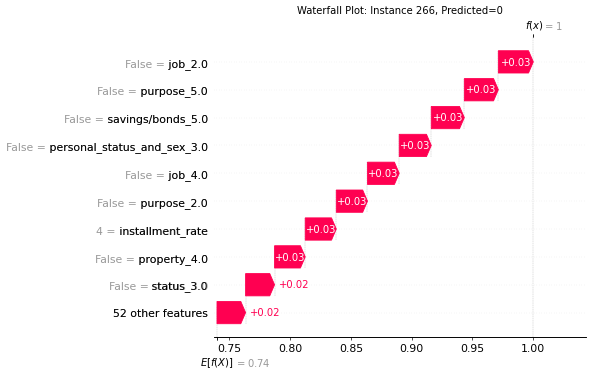

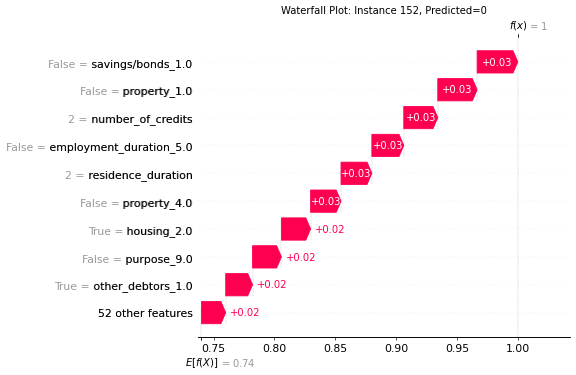

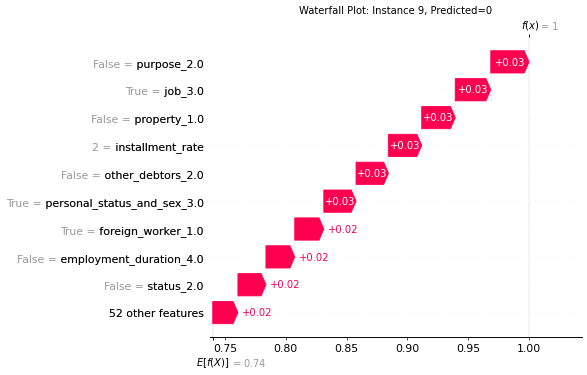

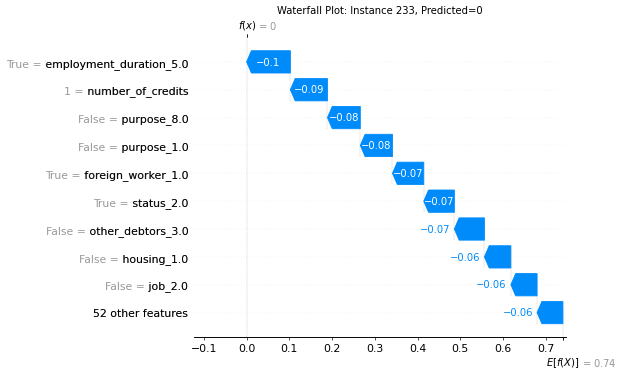

In [596]:
import matplotlib.pyplot as plt

for i in random_indices:
    predicted_class = int(y_pred[i])
    
    shap_vals = shap_values[:, :, predicted_class][i]  
    base_val = explainer.expected_value[predicted_class]

    # shap.Explanation
    expl = shap.Explanation(
        values=shap_vals,
        base_values=base_val,
        data=X.iloc[i],
        feature_names=X.columns
    )
    
    fig, ax = plt.subplots(figsize=(6,4))
    
    # Use show=False so we can set a custom title
    shap.plots.waterfall(expl, show=False)
    
    #custom title
    plt.title(f"Waterfall Plot: Instance {i}, Predicted={predicted_class}")
    
    plt.show()


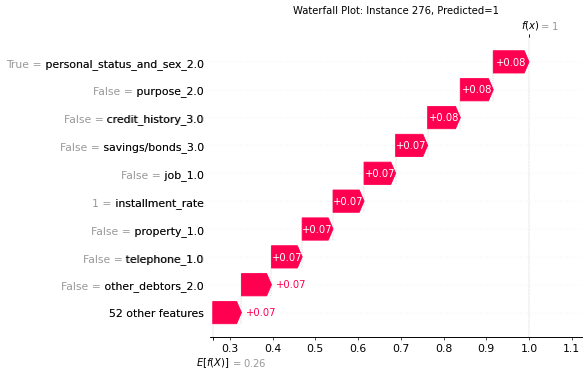

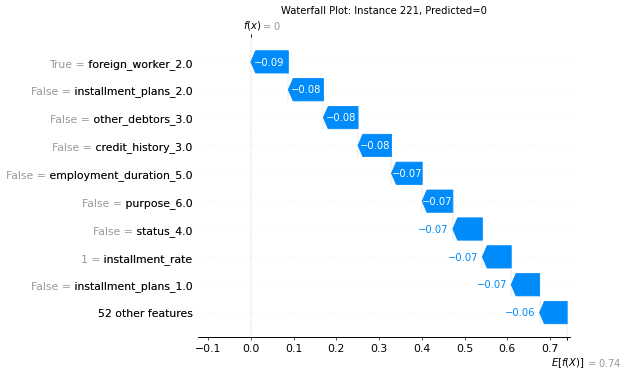

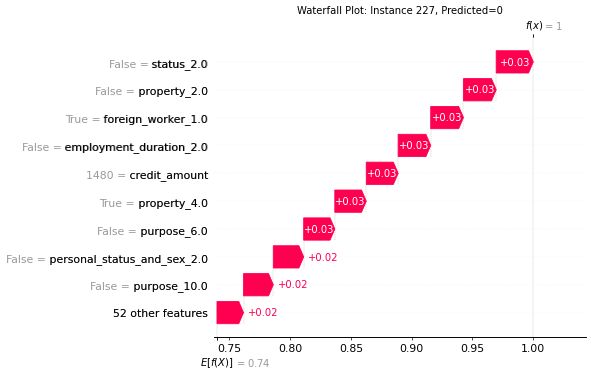

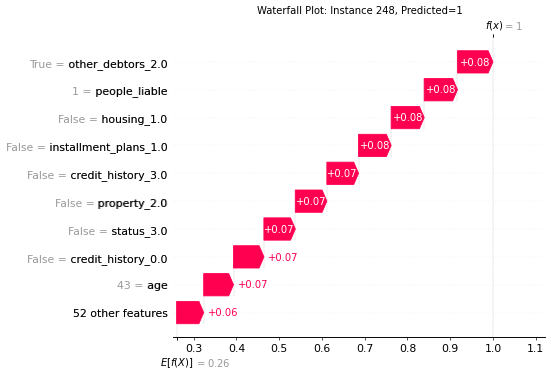

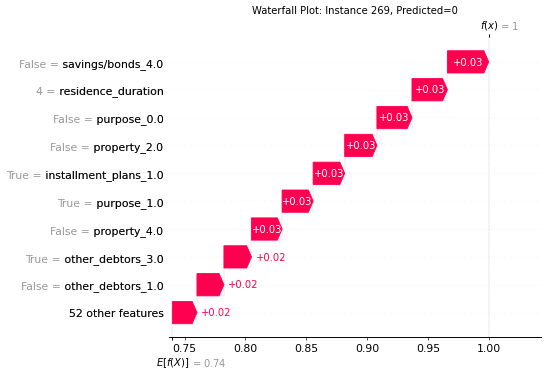

In [600]:
import matplotlib.pyplot as plt
for i in outlier_indices:
    predicted_class = int(y_pred[i])
    
    shap_vals = shap_values[:, :, predicted_class][i]  
    base_val = explainer.expected_value[predicted_class]

    #shap.Explanation
    expl = shap.Explanation(
        values=shap_vals,
        base_values=base_val,
        data=X.iloc[i],
        feature_names=X.columns
    )
    
    fig, ax = plt.subplots(figsize=(6,4))
    
    # Use show=False so we can set a custom title
    shap.plots.waterfall(expl, show=False)
    
    #custom title
    plt.title(f"Waterfall Plot: Instance {i}, Predicted={predicted_class}")
    
    plt.show()


In [527]:
#LIME Explainer
explainer_class = lime.lime_tabular.LimeTabularExplainer(
    X.values,  # Dataset
    feature_names=X.columns,
    mode='classification'
)

In [598]:
#initialize LIME with real column names
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X.values,
    feature_names=X.columns.tolist(),  # real feature names
    mode="classification"
)

#Explanation function using the real columns
def explain_lime_instance(idx):
    """
    Explain instance `idx` from X using our predict_proba_fn
    """
    row_values = X.iloc[idx].values  #numeric features for row idx
    exp = explainer_lime.explain_instance(
        row_values,
        predict_proba_fn,     
        num_features=8     # number of features to display
    )
    print(f"\nLIME Explanation for instance {idx}, predicted={y_pred[idx]}")
    for feat, score in exp.as_list():
        print(f"{feat}: {score:.3f}")

    return exp.show_in_notebook()

print("\n=== LIME on Random Instances ===")
for idx in random_indices:
    explain_lime_instance(idx)

print("\n=== LIME on Outlier Instances ===")
for idx in outlier_indices:
    explain_lime_instance(idx)



=== LIME on Random Instances ===

LIME Explanation for instance 203, predicted=0.0
12.00 < duration <= 18.00: -0.001
1387.50 < credit_amount <= 2331.00: -0.000
0.00 < credit_history_4.0 <= 1.00: -0.000
age <= 26.00: -0.000
1.00 < number_of_credits <= 2.00: -0.000
0.00 < purpose_3.0 <= 1.00: -0.000
0.00 < property_3.0 <= 1.00: -0.000
0.00 < employment_duration_3.0 <= 1.00: -0.000



LIME Explanation for instance 266, predicted=0.0
job_1.0 > 0.00: -0.004
employment_duration_1.0 > 0.00: -0.002
12.00 < duration <= 18.00: -0.001
credit_amount <= 1387.50: -0.001
age > 42.00: -0.000
0.00 < credit_history_4.0 <= 1.00: -0.000
0.00 < purpose_3.0 <= 1.00: -0.000
0.00 < property_3.0 <= 1.00: -0.000



LIME Explanation for instance 152, predicted=0.0
employment_duration_2.0 > 0.00: -0.001
savings/bonds_5.0 > 0.00: -0.001
18.00 < duration <= 24.00: -0.001
2331.00 < credit_amount <= 3962.25: -0.000
age <= 26.00: -0.000
1.00 < number_of_credits <= 2.00: -0.000
0.00 < purpose_3.0 <= 1.00: -0.000
savings/bonds_1.0 <= 0.00: -0.000



LIME Explanation for instance 9, predicted=0.0
purpose_4.0 > 0.00: -0.015
status_3.0 > 0.00: -0.002
32.00 < age <= 42.00: -0.000
credit_amount <= 1387.50: -0.000
other_debtors_3.0 <= 0.00: -0.000
duration <= 12.00: -0.000
installment_rate <= 2.00: -0.000
telephone_1.0 <= 0.00: -0.000



LIME Explanation for instance 233, predicted=0.0
purpose_9.0 > 0.00: -0.001
people_liable > 1.00: -0.001
18.00 < duration <= 24.00: -0.001
property_2.0 > 0.00: -0.001
employment_duration_5.0 > 0.00: -0.001
credit_amount <= 1387.50: -0.001
32.00 < age <= 42.00: -0.000
0.00 < status_2.0 <= 1.00: -0.000



=== LIME on Outlier Instances ===

LIME Explanation for instance 276, predicted=1.0
purpose_10.0 > 0.00: 0.006
foreign_worker_2.0 > 0.00: 0.005
credit_history_0.0 > 0.00: 0.003
installment_plans_1.0 > 0.00: 0.001
job_4.0 > 0.00: 0.001
26.00 < age <= 32.00: 0.001
duration > 24.00: 0.001
property_2.0 > 0.00: 0.001



LIME Explanation for instance 221, predicted=0.0
foreign_worker_2.0 > 0.00: -0.005
job_1.0 > 0.00: -0.004
number_of_credits > 2.00: -0.002
status_3.0 > 0.00: -0.002
people_liable > 1.00: -0.001
age > 42.00: -0.001
purpose_0.0 > 0.00: -0.001
purpose_8.0 <= 0.00: -0.000



LIME Explanation for instance 227, predicted=0.0
job_1.0 > 0.00: -0.004
number_of_credits > 2.00: -0.003
status_3.0 > 0.00: -0.002
savings/bonds_3.0 > 0.00: -0.002
employment_duration_1.0 > 0.00: -0.002
housing_3.0 > 0.00: -0.001
installment_plans_1.0 > 0.00: -0.001
property_4.0 > 0.00: -0.001



LIME Explanation for instance 248, predicted=1.0
purpose_10.0 > 0.00: 0.006
other_debtors_2.0 > 0.00: 0.003
personal_status_and_sex_1.0 > 0.00: 0.003
employment_duration_1.0 > 0.00: 0.002
2.00 < residence_duration <= 3.00: 0.001
job_4.0 > 0.00: 0.001
age > 42.00: 0.001
duration > 24.00: 0.001



LIME Explanation for instance 269, predicted=0.0
credit_history_1.0 > 0.00: -0.004
other_debtors_3.0 > 0.00: -0.002
purpose_1.0 > 0.00: -0.002
installment_plans_1.0 > 0.00: -0.001
people_liable > 1.00: -0.001
savings/bonds_5.0 > 0.00: -0.001
employment_duration_2.0 > 0.00: -0.001
housing_1.0 > 0.00: -0.001
